# Icclim indices - WSDI (Cold-spell duration index (days))

Assessment of model icclim indices

In [1]:
import glob
import warnings
warnings.filterwarnings('ignore')
import yaml
import string
import logging
logging.basicConfig(level=logging.CRITICAL)

import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs
import xarray as xr

#import sys
#sys.path.append('/g/data/xv83/users/at2708/bias_adjustment/evaluation/npcp/results')
import utils

In [2]:
outdir = '/g/data/ia39/npcp/code/results/figures/'

In [3]:
def average_index(da):
    """Calculate the average index"""
    
    da_mean = da.mean(dim='time')

    return da_mean

In [4]:
# Data collection and processing

def get_data(gcm, rcm, task, index):
    """Get processed icclim data"""
    
    tasks={
        "historical":{
            "start_date": "19800101",
            "end_date": "20191231",
            "start_date_train": "19800101",
            "end_date_train": "20191231"
        },
        "xvalidation":{
            "start_date": "19900101",
            "end_date": "20191231",
            "start_date_train": "19600101",
            "end_date_train": "19891231"
        },
        "projection":{
            "start_date": "20600101",
            "end_date": "20991231",
            "start_date_train": "19800101",
            "end_date_train": "20191231"
        },
        "agcd_training":{
            "start_date": "19600101",
            "end_date": "19891231",
        }
    }
    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5', 'NCAR-CESM2', 'EC-Earth-Consortium-EC-Earth3']
    assert rcm in ['BOM-BARPA-R', 'CSIRO-CCAM-2203', 'UQ-DES-CCAM-2105']
    assert task in ['historical', 'xvalidation']
    
    da_dict = {}
        
    base_dir = '/g/data/ia39/npcp/data/icclim/'+index+'/'+index+'_NPCP-20i_'

    if gcm=='CSIRO-ACCESS-ESM1-5':
        real='r6i1p1f1'
    elif gcm=='NCAR-CESM2':
        real='r11i1p1f1'
    else:
        real='r1i1p1f1'
    
    if gcm == 'ECMWF-ERA5' and task == 'xvalidation':
        start_date = "20000101"
        end_date = "20191231"
    else:
        start_date = tasks[task]['start_date']
        end_date = tasks[task]['end_date']
    
    if task == 'historical' or task == 'xvalidation':  
        # AGCD
        path = base_dir+'AGCD_v1-0-1_day_'+tasks[task]['start_date']+'-'+tasks[task]['end_date']+'.nc'
        da_dict['agcd'] = xr.open_dataset(path)[index]
        
    if task == 'xvalidation':
        # AGCD training 
        path = base_dir+'AGCD_v1-0-1_day_'+tasks['agcd_training']['start_date']+'-'+tasks['agcd_training']['end_date']+'.nc'
        da_dict['agcd_training'] = xr.open_dataset(path)[index]  

    if task == 'projection' or task == 'xvalidation':  
        # QDC GCM 
        path_base = base_dir+gcm+'_*_'+real+'_GCM_v1_day_'+start_date+'-'+end_date+'_qdc-'
        path = glob.glob(path_base + '*.nc')
        if len(path) == 1:        
            da_dict['gcm_qdc'] = xr.open_dataset(path[0])[index]
        elif len(path) == 0:
            print(f"Warning: GCM_qdc data for {gcm} is missing for the period {start_date} to {end_date}.")
            da_dict['gcm_qdc'] = None
        else:
            raise OSError(f"Too many GCM_qdc files for {gcm}, {start_date} to {end_date}.")
            
        # QDC RCMs
        path_base = base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date+'_qdc-'
        path = glob.glob(path_base + '*.nc')
        if len(path) == 1:
            da_dict['rcm_qdc'] = xr.open_dataset(path[0])[index]
        elif len(path) == 0:
            print(f"Warning: RCM_qdc data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
            da_dict['rcm_qdc'] = None
        else:
            raise OSError(f"Too many RCM_qdc files for {gcm}/{rcm}, {start_date} to {end_date}.")

    # GCM raw
    if gcm == 'ECMWF-ERA5':
        path_base = base_dir+gcm+'_evaluation_'+start_date+'-'+end_date
    else:
        path_base = base_dir+gcm+'_*_'+real+'_GCM_latest_day_'+start_date+'-'+end_date
    path = glob.glob(path_base + '.nc')
    if len(path) == 1:
        da_dict['gcm_raw'] = xr.open_dataset(path[0])[index]
    elif len(path) == 0:
        print(f"Warning: GCM_raw data for {gcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['gcm_raw'] = None
    else:
        raise OSError(f"Too many GCM_raw files for {gcm}, {start_date} to {end_date}.")
        
    # RCM raw
    path_base = base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date
    path = glob.glob(path_base + '.nc')
    if len(path) == 1:
        da_dict['rcm_raw'] = xr.open_dataset(path[0])[index]
    elif len(path) == 0: 
        print(f"Warning: RCM_raw data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['rcm_raw'] = None
    else:
        raise OSError(f"Too many RCM_raw files for {gcm}/{rcm}, {start_date} to {end_date}.")
    
    # ECDFM GCM 
    path_base=base_dir+gcm+'_*_'+real+'_GCM_v1_day_'+start_date+'-'+end_date+'_ecdfm-'
    path = glob.glob(path_base + '*.nc')
    if len(path) == 1:
        da_dict['gcm_ecdfm'] = xr.open_dataset(path[0])[index]
    elif len(path) == 0:
        print(f"Warning: GCM_ecdfm data for {gcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['gcm_ecdfm'] = None
    else:
        raise OSError(f"Too many GCM_ecdfm files for {gcm}/{rcm}, {start_date} to {end_date}.")
        
    # ECDFM RCMs
    path_base = base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date+'_ecdfm-'
    path = glob.glob(path_base + '*.nc')
    if len(path) == 1:
        da_dict['rcm_ecdfm'] = xr.open_dataset(path[0])[index]
    elif len(path) == 0:
        print(f"Warning: RCM_ecdfm data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['rcm_ecdfm'] = None
    else:
        raise OSError(f"Too many RCM_ecdfm files for {gcm}/{rcm}, {start_date} to {end_date}.")
        
    # QME RCMs
    path_base = base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date+'_qme-'
    path = glob.glob(path_base + '*.nc')
    if len(path) == 1:
        da_dict['rcm_qme'] = xr.open_dataset(path[0])[index]
        lats = np.round(np.arange(-44, -9.9, 0.2), decimals=1)
        if np.allclose(da_dict['rcm_qme']['lat'].values, lats, rtol=1e-05, atol=1e-08, equal_nan=True):
            lat_attrs = da_dict['rcm_qme']['lat'].attrs
            da_dict['rcm_qme'] = da_dict['rcm_qme'].assign_coords({'lat': lats})
            da_dict['rcm_qme'].attrs = lat_attrs
        lons = np.round(np.arange(112, 154.01, 0.2), decimals=1)
        if np.allclose(da_dict['rcm_qme']['lon'].values, lons, rtol=1e-05, atol=1e-08, equal_nan=True):
            lon_attrs = da_dict['rcm_qme']['lon'].attrs
            da_dict['rcm_qme'] = da_dict['rcm_qme'].assign_coords({'lon': lons})
            da_dict['rcm_qme'].attrs = lon_attrs
    elif len(path) == 0:
        print(f"Warning: RCM_qme data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['rcm_qme'] = None 
    else:
        raise OSError(f"Too many RCM_qme files for {gcm}/{rcm}, {start_date} to {end_date}.")
    
    # MBCN RCMs
    path_base=base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date+'_mbcn-'
    path = glob.glob(path_base + '*.nc')
    if len(path) == 1:
        da_dict['rcm_mbcn'] = xr.open_dataset(path[0])[index]        
    elif len(path) == 0:
        print(f"Warning: RCM_mbcn data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['rcm_mbcn'] = None
    else:
        raise OSError(f"Too many RCM_mbcn files for {gcm}/{rcm}, {start_date} to {end_date}.")
    
    # MRNBC RCMs
    path_base=base_dir+gcm+'_*_'+real+'_'+rcm+'_v1_day_'+start_date+'-'+end_date+'_mrnbc-'
    path = glob.glob(path_base + '*.nc')
    if len(path) == 1:
        da_dict['rcm_mrnbc'] = xr.open_dataset(path[0])[index]
    elif len(path) == 0:
        print(f"Warning: RCM_mrnbc data for {gcm}/{rcm} is missing for the period period {start_date} to {end_date}.")
        da_dict['rcm_mrnbc'] = None
    else:
        raise OSError(f"Too many RCM_mrnbc files for {gcm}/{rcm}, {start_date} to {end_date}.")
        
    return da_dict

In [5]:
# Plotting values

def plot_metric(ax, da, cmap, levels, index, model_name, letter_index, ob_fractions=None):
    """Plot the PT index for a particular model"""

    data = average_index(da)
    data = utils.clip_data(data, utils.get_aus_shape())
    if ob_fractions is not None:
        data = utils.mask_by_pr_ob_fraction(data, ob_fractions, threshold=0.9)    
    
    im = data.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=levels,
        extend='both',
        add_colorbar=False,
#        cbar_kwargs={'label': units},
    )
    cb = plt.colorbar(im)
    cb.set_label(label=units, size='x-large')
    cb.ax.tick_params(labelsize='x-large')
    letter = string.ascii_lowercase[letter_index]
    ax.text(0.02, 0.92, f'({letter})', transform=ax.transAxes, fontsize='xx-large')
    ax.set_title(model_name, fontsize='xx-large')
    ax.coastlines()


model_labels = {
    'CSIRO-ACCESS-ESM1-5': 'ACCESS-ESM1-5',
    'NCAR-CESM2': 'CESM2',
    'EC-Earth-Consortium-EC-Earth3': 'EC-Earth3',
    'ECMWF-ERA5': 'ERA5',
    'BOM-BARPA-R': 'BARPA-R',
    'CSIRO-CCAM-2203': 'CCAM-v2203-SN',
    'UQ-DES-CCAM-2105': 'CCAM-v2105',
}
    
    
def plot_values(gcm, rcm, task, index, cmap, levels, outfile=None):
    """Plot the index for each model/method"""
    
    da_dict = get_data(gcm, rcm, task, index)

    gcm_label = model_labels[gcm]
    rcm_label = model_labels[rcm]
    
    ncols = 5 if task == 'xvalidation' else 4
    nrows = 3
    plot_nums = np.arange(1, (ncols * nrows) + 1)
    
    if index=='R10mm' or index=='R20mm' or index=='R95pTOT' or index=='R99pTOT':
        ob_fractions = utils.get_pr_weights(gcm, task)
    else:
        ob_fractions = None
    
    fig = plt.figure(figsize=[7 * ncols, 5 * nrows])
    
    plot_index = 0
    letter_index = 0
    # GCM bias indexection
    if da_dict['gcm_raw'] is not None:
        ax_gcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_gcm1, da_dict['gcm_raw'], cmap, levels, index, gcm_label, letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    plot_index = plot_index + 1

    if da_dict['gcm_ecdfm'] is not None:
        ax_gcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_gcm2,  da_dict['gcm_ecdfm'], cmap, levels, index, f'{gcm_label} (ECDFm)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1   # blank space

    if task == 'xvalidation':
        plot_index = plot_index + 1
        if da_dict['gcm_qdc'] is not None:
            ax_gcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_metric(
                ax_gcm4, da_dict['gcm_qdc'], cmap, levels, index, f'{gcm_label} (QDC)', letter_index, ob_fractions=ob_fractions,
            )
            letter_index = letter_index + 1

    plot_index = plot_index + 1
    ax_obs = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
    plot_metric(
        ax_obs, da_dict['agcd'], cmap, levels, index, 'AGCD', letter_index, ob_fractions=ob_fractions
    )
    letter_index = letter_index + 1
        
    # RCM bias indexection
    plot_index = plot_index + 1
    if da_dict['rcm_raw'] is not None:
        ax_rcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm1, da_dict['rcm_raw'], cmap, levels, index, f'{rcm_label} (raw)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1

    if da_dict['rcm_ecdfm'] is not None:
        ax_rcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm2, da_dict['rcm_ecdfm'], cmap, levels, index, f'{rcm_label} (ECDFm)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1

    if da_dict['rcm_qme'] is not None:
        ax_rcm3 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm3, da_dict['rcm_qme'], cmap, levels, index, f'{rcm_label} (QME)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    if task == 'xvalidation':
        plot_index = plot_index + 1
        if da_dict['rcm_qdc'] is not None:
            ax_rcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_metric(
                ax_rcm4, da_dict['rcm_qdc'], cmap, levels, index, f'{rcm_label} (QDC)', letter_index, ob_fractions=ob_fractions,
            )
            letter_index = letter_index + 1

        plot_index = plot_index + 1
        ax_rcm5 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm5, da_dict['agcd_training'], cmap, levels, index, f'AGCD (training data)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
        plot_index = plot_index - 1
    # RCM multivariate bias correction
    plot_index = plot_index + 2 
    
    plot_index = plot_index + 1
    if da_dict['rcm_mbcn'] is not None:
        ax_rcm6 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm6, da_dict['rcm_mbcn'], cmap, levels, index, f'{rcm_label} (MBCn)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1

    if da_dict['rcm_mrnbc'] is not None:
        ax_rcm7 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        plot_metric(
            ax_rcm7, da_dict['rcm_mrnbc'], cmap, levels, index, f'{rcm_label} (MRNBC)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1

    if gcm == 'ECMWF-ERA5':
        start_year = '2000' if task == 'xvalidation' else '1980'
    else:
        start_year = '1990' if task == 'xvalidation' else '1980'
    
    print(f'Annual mean {start_year}-2019 ' + index)
    if outfile:
        figpath = f'{outdir}{var}_{index}-values_task-{task}_{gcm}_{rcm}.png'
        print(figpath)
        plt.savefig(figpath, dpi=300, bbox_inches='tight')
    plt.show()

In [6]:
# Plotting bias

def plot_bias(ax, da_obs, da_model, cmap, levels, index, model_name, letter_index, ob_fractions=None):
    """Plot the bias for a particular model"""

    index_model = average_index(da_model)
    index_obs = average_index(da_obs)
    
    bias = index_model - index_obs
    bias = utils.clip_data(bias, utils.get_aus_shape())
    if ob_fractions is not None:
        bias = utils.mask_by_pr_ob_fraction(bias, ob_fractions, threshold=0.9)    
    mae = float(np.nanmean(np.abs(bias)))
    
    im = bias.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=levels,
        extend='both',
        add_colorbar=False,
#        cbar_kwargs={'label': units},
    )
    cb = plt.colorbar(im)
    cb.set_label(label=units, size='x-large')
    cb.ax.tick_params(labelsize='x-large')
    letter = string.ascii_lowercase[letter_index]
    ax.text(0.02, 0.92, f'({letter})', transform=ax.transAxes, fontsize='xx-large')
    ax.text(0.02, 0.02, f'MAE: {mae:.2f} {units}', transform=ax.transAxes, fontsize='x-large')
    ax.set_title(model_name, fontsize='xx-large')
    ax.coastlines()
    
    return mae


def plot_comparison(gcm, rcm, task, index, cmap, levels, outfile=None):
    """Plot the complete comparison"""

    da_dict = get_data(gcm, rcm, task, index)

    gcm_label = model_labels[gcm]
    rcm_label = model_labels[rcm]
    
    ncols = 5 if task == 'xvalidation' else 3
    nrows = 3
    plot_nums = np.arange(1, (ncols * nrows) + 1)
    
    if index=='R10mm' or index=='R20mm' or index=='R95pTOT' or index=='R99pTOT':
        ob_fractions = utils.get_pr_weights(gcm, task)
    else:
        ob_fractions = None

    mae_dict = {}
    fig = plt.figure(figsize=[7 * ncols, 5 * nrows])
    
    plot_index = 0
    letter_index = 0
    # GCM bias correction
    if da_dict['gcm_raw'] is not None:
        ax_gcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['GCM'] = plot_bias(
            ax_gcm1, da_dict['agcd'], da_dict['gcm_raw'], cmap, levels, index, f'{gcm_label} (raw)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    plot_index = plot_index + 1

    if da_dict['gcm_ecdfm'] is not None:
        ax_gcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae = plot_bias(
            ax_gcm2, da_dict['agcd'], da_dict['gcm_ecdfm'], cmap, levels, index, f'{gcm_label} (ECDFm)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1   # blank space

    if task == 'xvalidation':
        plot_index = plot_index + 1
        if da_dict['gcm_qdc'] is not None:
            ax_gcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            mae = plot_bias(
                ax_gcm4, da_dict['agcd'],da_dict['gcm_qdc'], cmap, levels, index, f'{gcm_label} (QDC)', letter_index, ob_fractions=ob_fractions,
            )
            letter_index = letter_index + 1
        plot_index = plot_index + 1
    plot_index = plot_index + 1

    # RCM bias correction
    if da_dict['rcm_raw'] is not None:
        ax_rcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['RCM'] = plot_bias(
            ax_rcm1, da_dict['agcd'], da_dict['rcm_raw'], cmap, levels, index, f'{rcm_label} (raw)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1
    if da_dict['rcm_ecdfm'] is not None:
        ax_rcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['ECDFm'] = plot_bias(
            ax_rcm2, da_dict['agcd'], da_dict['rcm_ecdfm'], cmap, levels, index, f'{rcm_label} (ECDFm)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
        
    plot_index = plot_index + 1
    if da_dict['rcm_qme'] is not None:
        ax_rcm3 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['QME'] = plot_bias(
            ax_rcm3, da_dict['agcd'], da_dict['rcm_qme'], cmap, levels, index, f'{rcm_label} (QME)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    plot_index = plot_index + 1
    if task == 'xvalidation':
        # plot_index = plot_index + 1
        if da_dict['rcm_qdc'] is not None:
            ax_rcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            mae_dict['QDC'] = plot_bias(
                ax_rcm4, da_dict['agcd'], da_dict['rcm_qdc'], cmap, levels, index, f'{rcm_label} (QDC)', letter_index, ob_fractions=ob_fractions,
            )
            letter_index = letter_index + 1
        
        plot_index = plot_index + 1
        ax_rcm5 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['training'] = plot_bias(
            ax_rcm5, da_dict['agcd'], da_dict['agcd_training'], cmap, levels, index, f'AGCD (training data)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
        plot_index = plot_index + 1 
        
    # RCM multivariate bias correction
    plot_index = plot_index + 1
    if da_dict['rcm_mbcn'] is not None:
        ax_rcm6 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['MBCn'] = plot_bias(
            ax_rcm6, da_dict['agcd'], da_dict['rcm_mbcn'], cmap, levels, index, f'{rcm_label} (MBCn)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1
    
    plot_index = plot_index + 1
    if da_dict['rcm_mrnbc'] is not None:
        ax_rcm7 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
        mae_dict['MRNBC'] = plot_bias(
            ax_rcm7, da_dict['agcd'], da_dict['rcm_mrnbc'], cmap, levels, index, f'{rcm_label} (MRNBC)', letter_index, ob_fractions=ob_fractions,
        )
        letter_index = letter_index + 1

    if gcm == 'ECMWF-ERA5':
        start_year = '2000' if task == 'xvalidation' else '1980'
    else:
        start_year = '1990' if task == 'xvalidation' else '1980'
    
    print(f'Bias (model minus obs) in the {start_year}-2019 ' + index)
    if outfile:
        figpath = f'{outdir}{var}_{index}-bias_task-{task}_{gcm}_{rcm}.png'
        print(figpath)
        plt.savefig(figpath, dpi=300, bbox_inches='tight')
    plt.show()
    
    return mae_dict

In [7]:
mae_data = {}

In [8]:
index = 'WSDI'
units = 'days'
var = 'tasmax'
levels_values = [1,2,3,4,5,6]
cmap_values = 'Reds'
levels_bias = [-5,-4,-3,-2,-1,1,2,3,4,5]
cmap_bias = 'RdBu_r'

## task-historical

Bias corrected data for the 1980-2019 period, using 1980-2019 as a training period.

In [9]:
task = 'historical'
mae_data[task] = {}

#### ERA5

In [10]:
gcm = 'ECMWF-ERA5'
task = 'historical'
rcm = 'BOM-BARPA-R'

Annual mean 1980-2019 WSDI


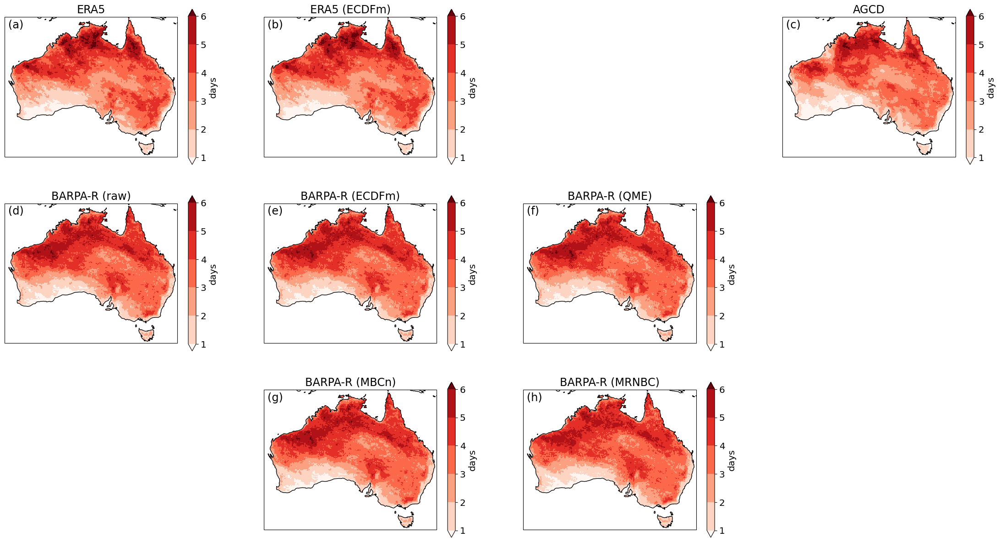

In [11]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_ECMWF-ERA5_BOM-BARPA-R.png


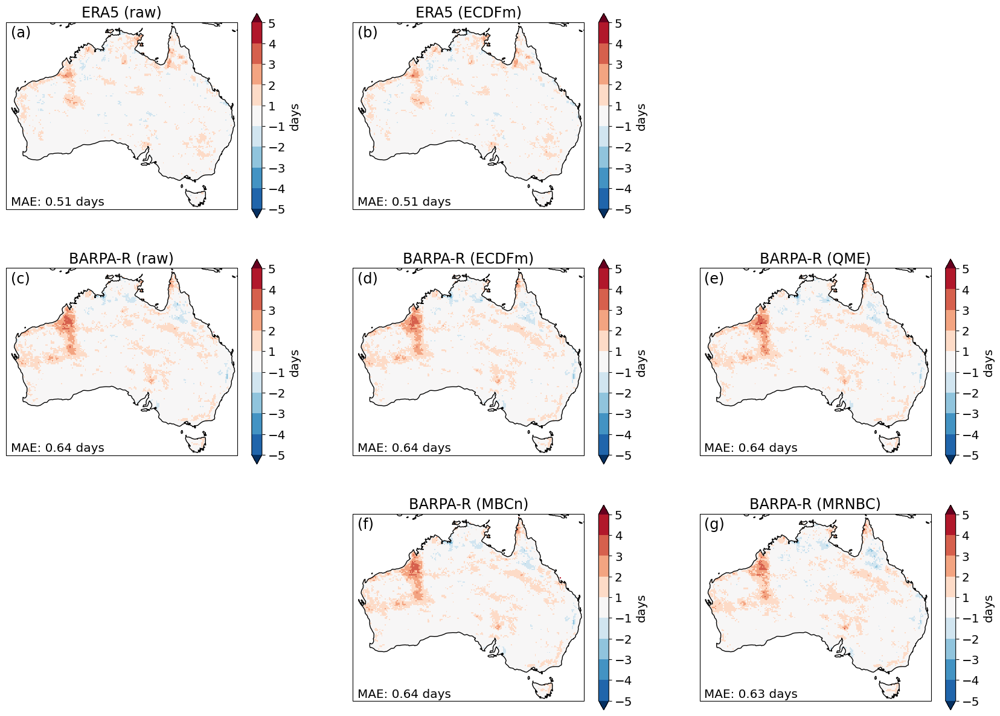

In [12]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_ECMWF-ERA5_CSIRO-CCAM-2203.png


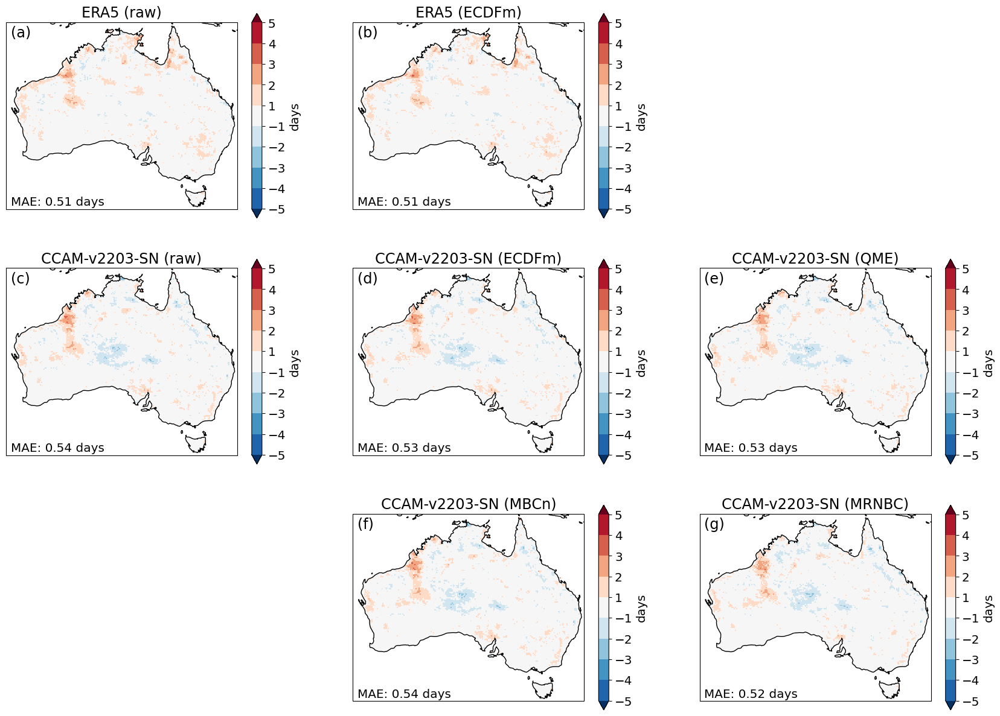

In [13]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_ECMWF-ERA5_UQ-DES-CCAM-2105.png


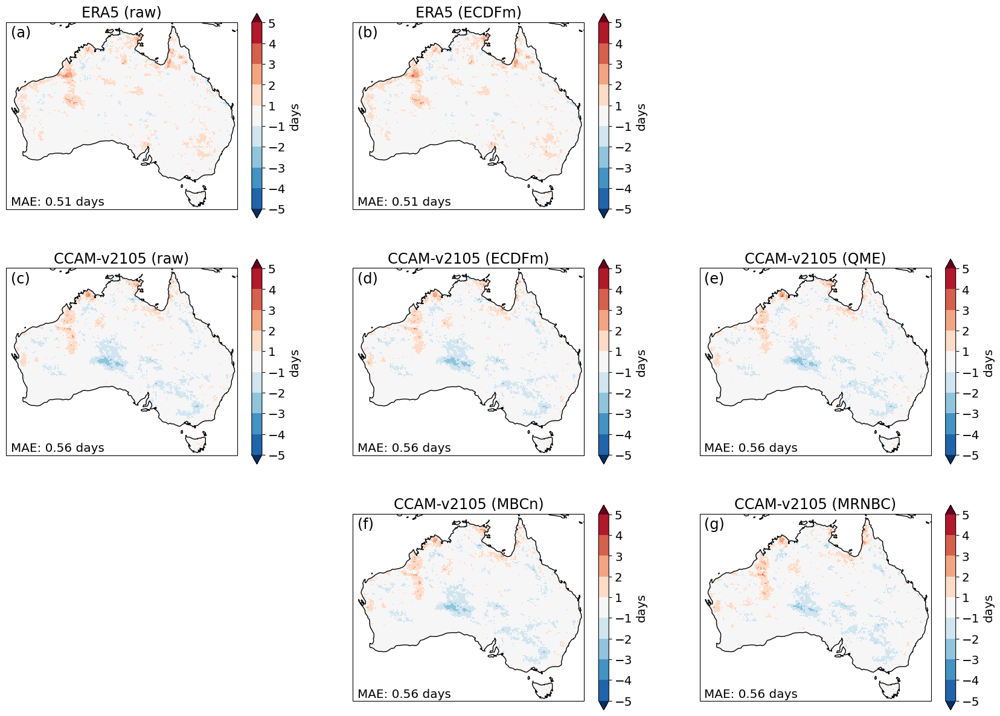

In [14]:
rcm = 'UQ-DES-CCAM-2105'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### ACCESS-ESM1-5

In [15]:
gcm = 'CSIRO-ACCESS-ESM1-5'
task = 'historical'
rcm = 'BOM-BARPA-R'

Annual mean 1980-2019 WSDI


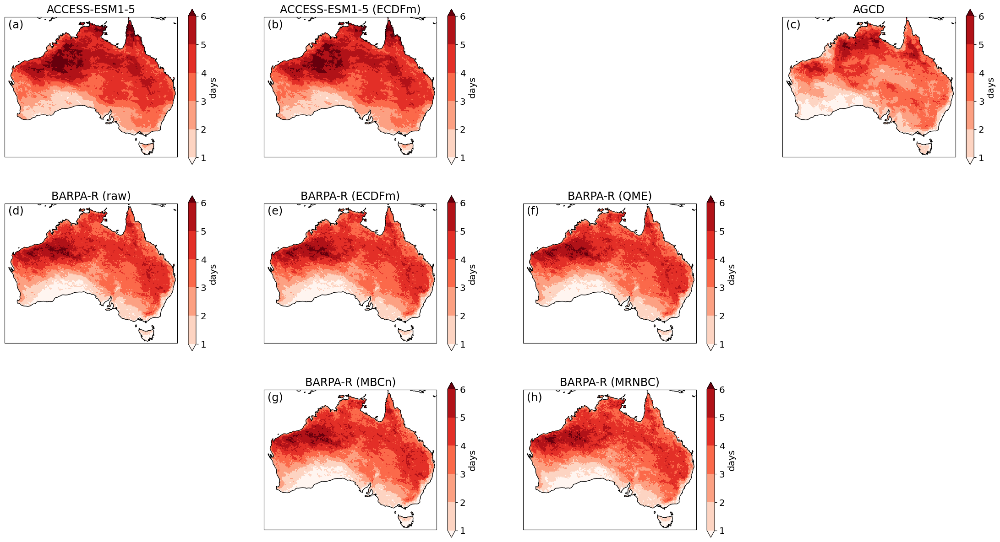

In [16]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_CSIRO-ACCESS-ESM1-5_BOM-BARPA-R.png


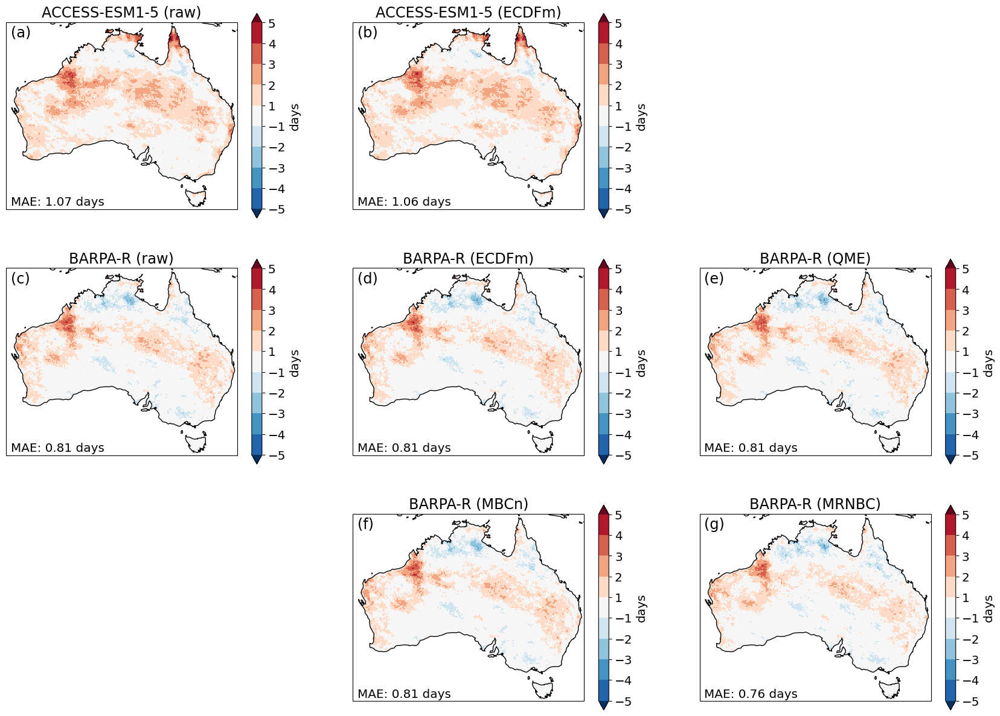

In [17]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_CSIRO-ACCESS-ESM1-5_CSIRO-CCAM-2203.png


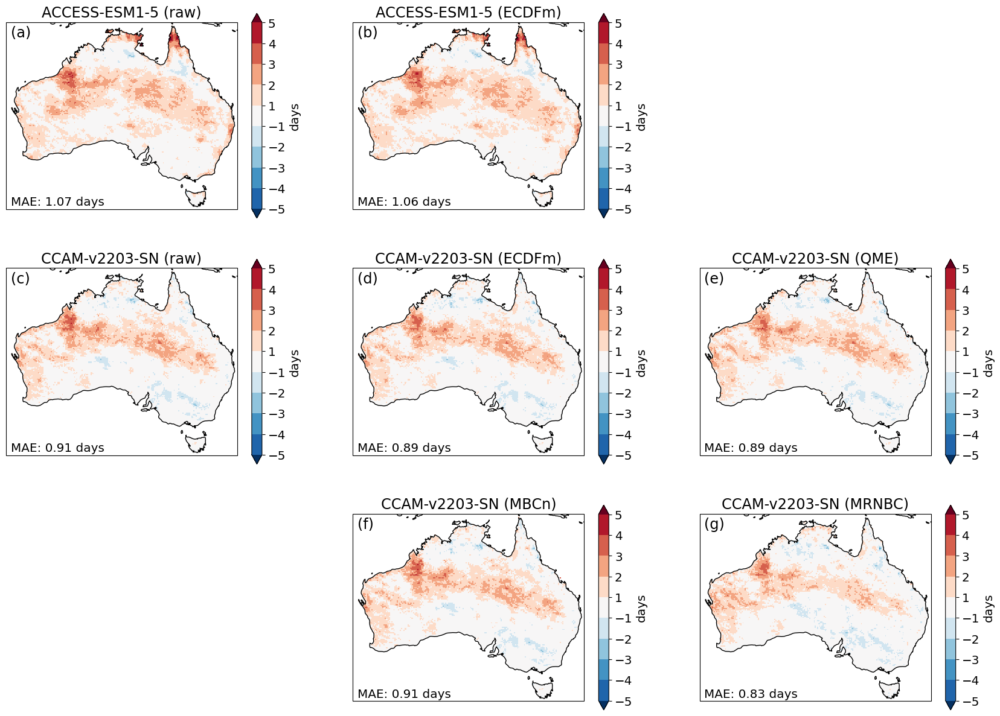

In [18]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_CSIRO-ACCESS-ESM1-5_UQ-DES-CCAM-2105.png


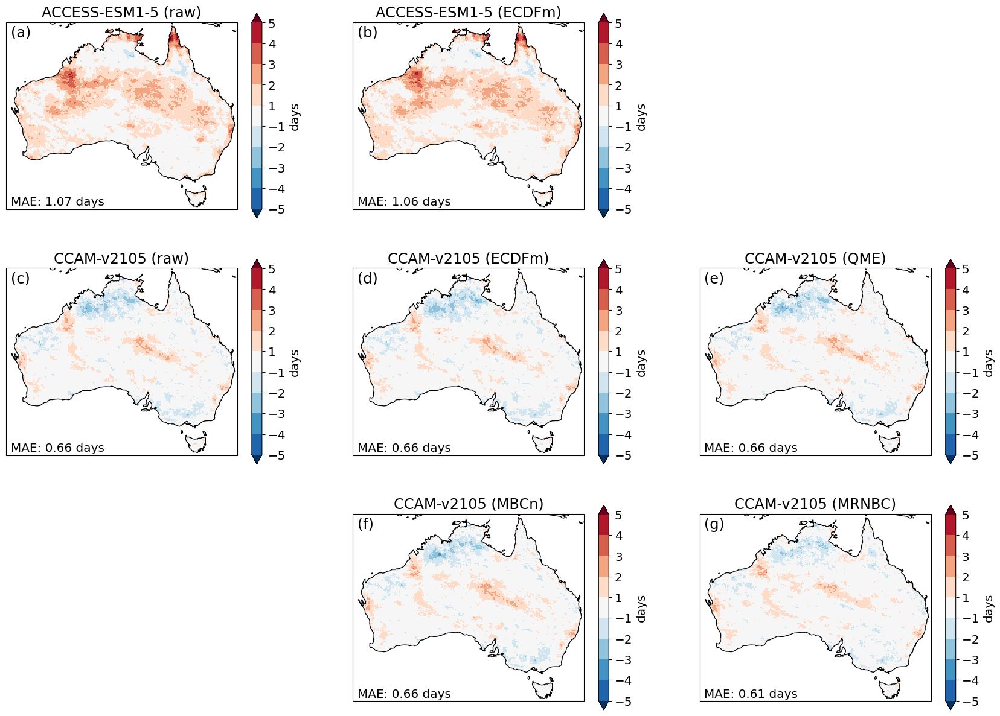

In [19]:
rcm = 'UQ-DES-CCAM-2105'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### CESM2

In [20]:
gcm = 'NCAR-CESM2'
task = 'historical'
rcm = 'BOM-BARPA-R'

Annual mean 1980-2019 WSDI


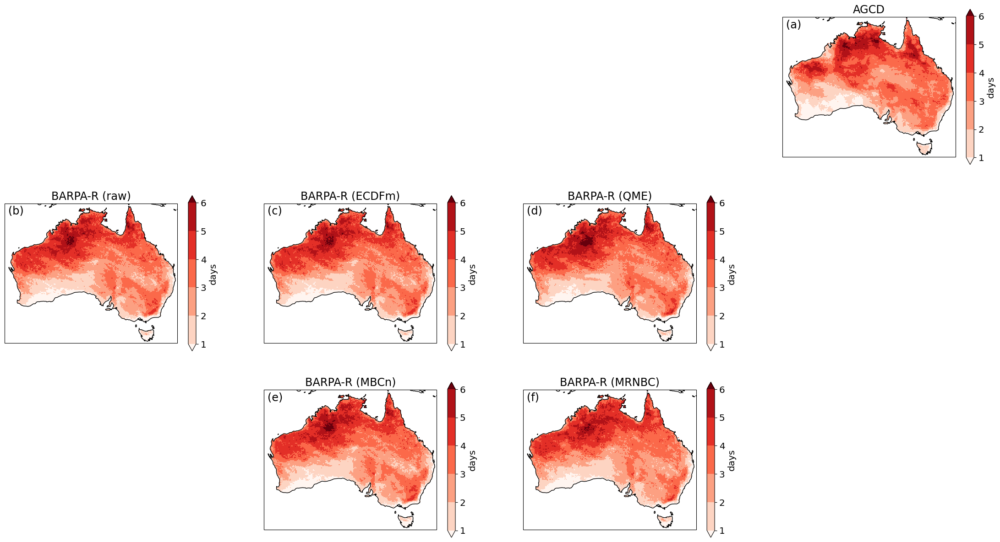

In [21]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_NCAR-CESM2_BOM-BARPA-R.png


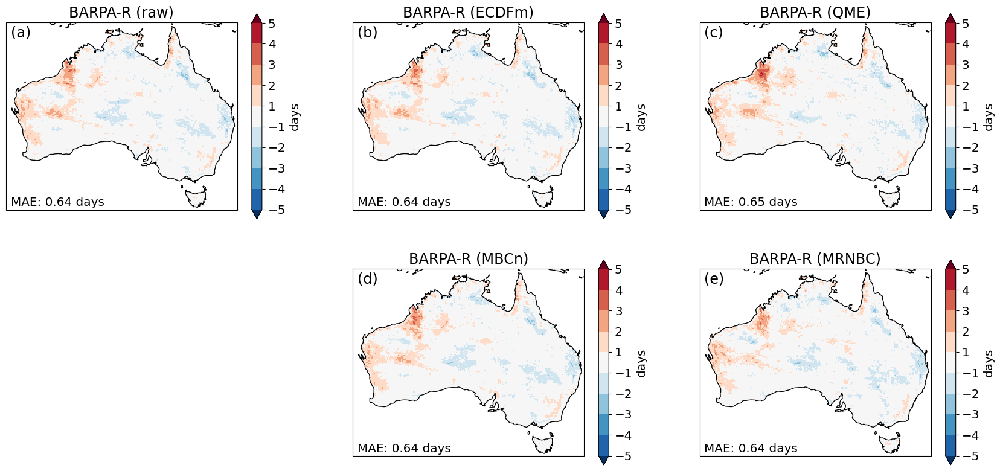

In [22]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_NCAR-CESM2_CSIRO-CCAM-2203.png


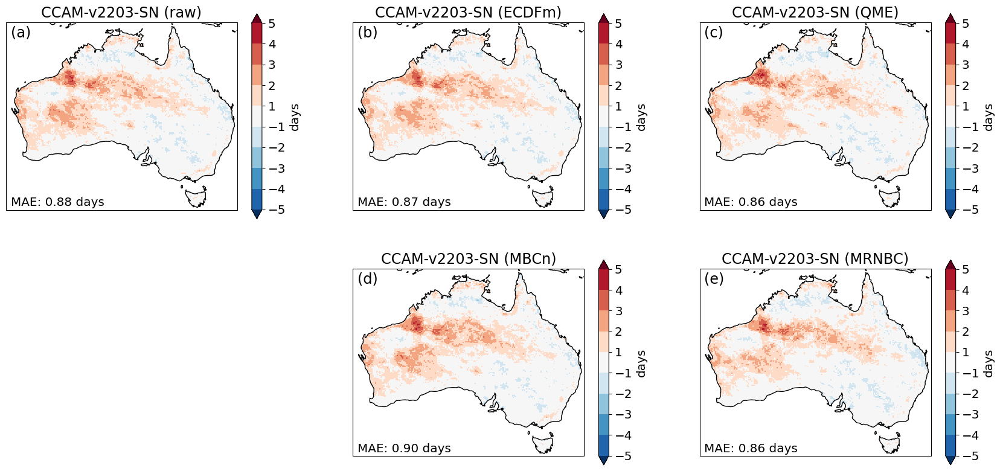

In [23]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### EC-Earth3

In [24]:
gcm = 'EC-Earth-Consortium-EC-Earth3'
task = 'historical'
rcm = 'BOM-BARPA-R'

Annual mean 1980-2019 WSDI


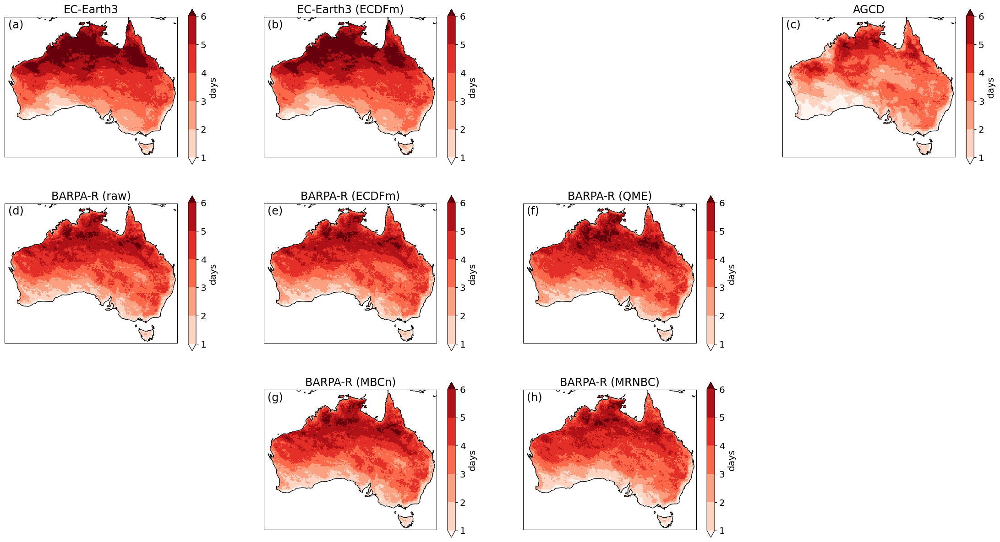

In [25]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_EC-Earth-Consortium-EC-Earth3_BOM-BARPA-R.png


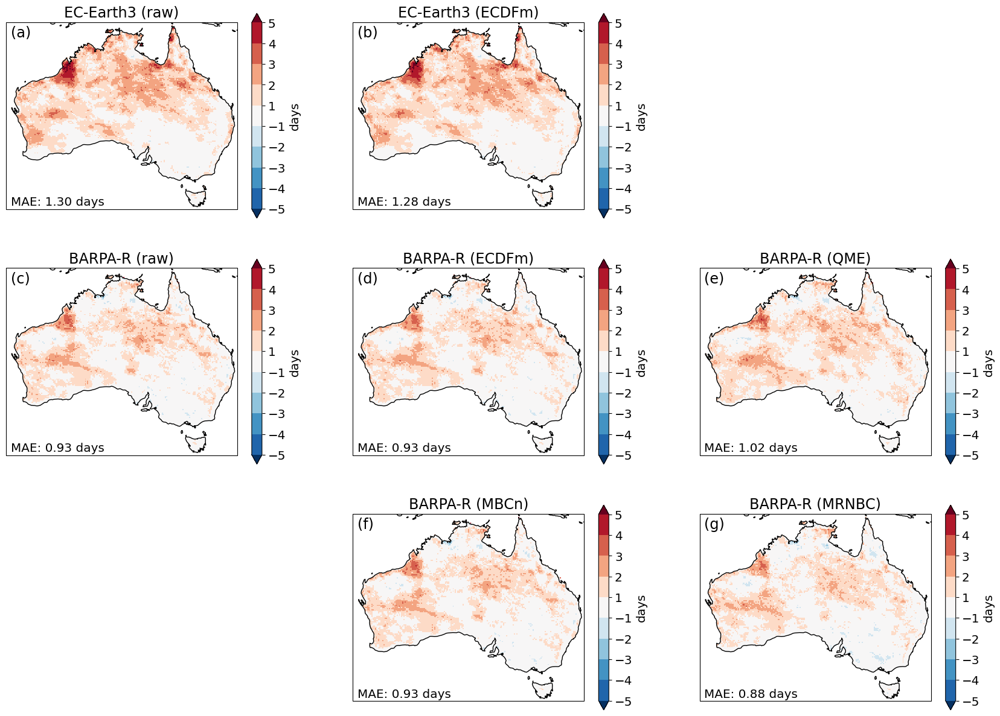

In [26]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1980-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-historical_EC-Earth-Consortium-EC-Earth3_CSIRO-CCAM-2203.png


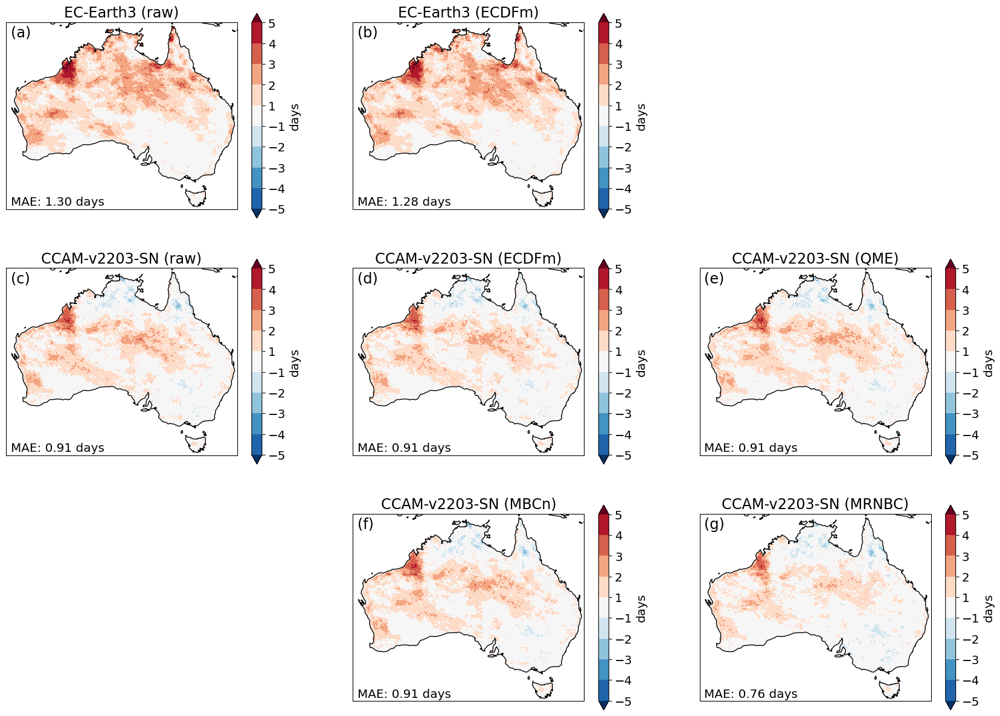

In [27]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

## task-xvalidation

In [28]:
task = 'xvalidation'
mae_data[task] = {}

#### ERA5

Bias corrected data for the 2000-2019 period, using 1980-1999 as a training period.

In [29]:
gcm = 'ECMWF-ERA5'
task = 'xvalidation'
rcm = 'BOM-BARPA-R'

Annual mean 2000-2019 WSDI


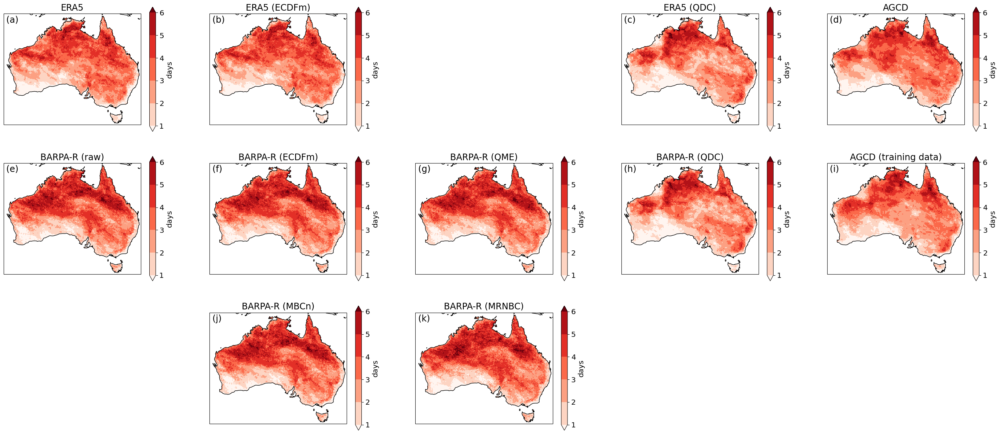

In [30]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 2000-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_ECMWF-ERA5_BOM-BARPA-R.png


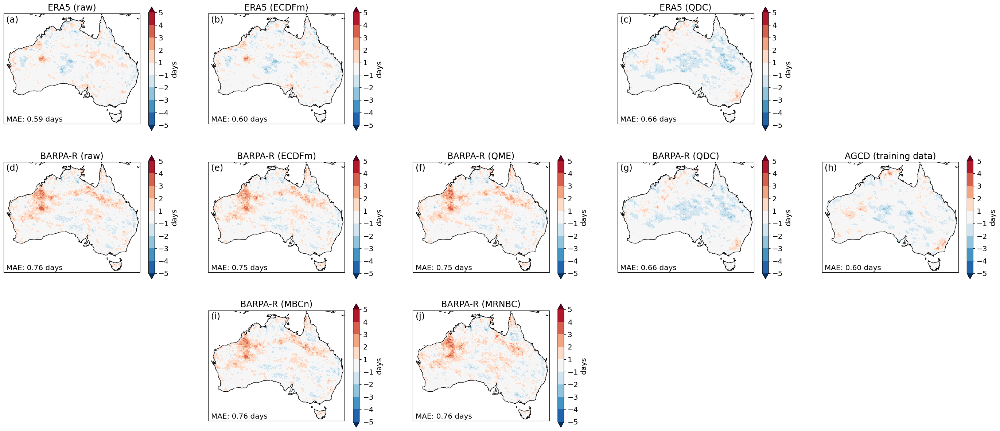

In [31]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 2000-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_ECMWF-ERA5_CSIRO-CCAM-2203.png


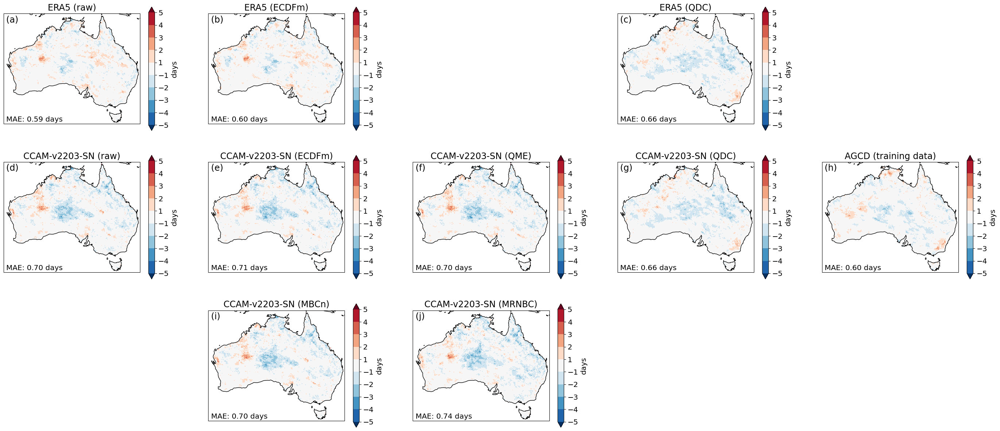

In [32]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 2000-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_ECMWF-ERA5_UQ-DES-CCAM-2105.png


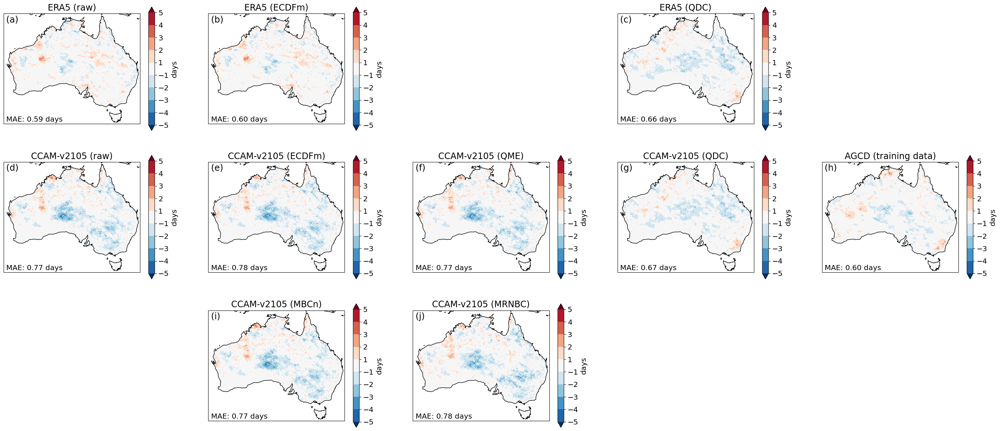

In [33]:
rcm = 'UQ-DES-CCAM-2105'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### ACCESS-ESM1-5

Bias corrected data for the 1990-2019 period, using 1960-1989 as a training period.

In [34]:
gcm = 'CSIRO-ACCESS-ESM1-5'
task = 'xvalidation'
rcm = 'BOM-BARPA-R'

Annual mean 1990-2019 WSDI


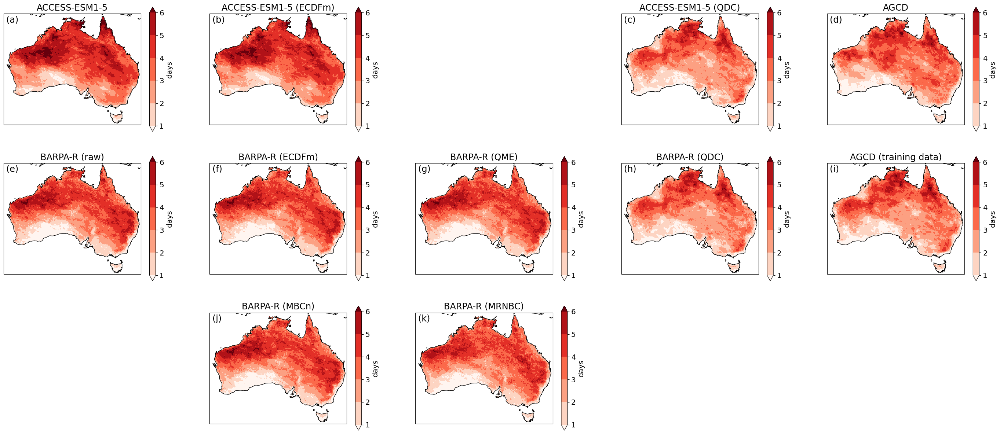

In [35]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_CSIRO-ACCESS-ESM1-5_BOM-BARPA-R.png


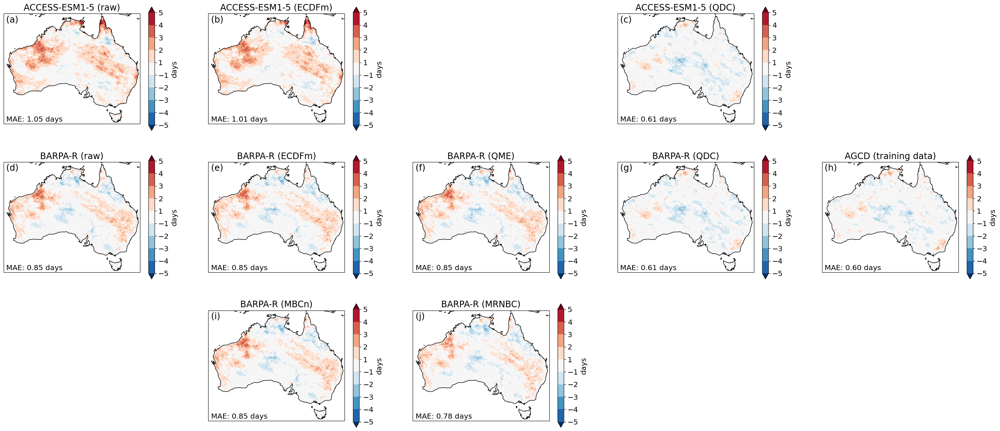

In [36]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_CSIRO-ACCESS-ESM1-5_CSIRO-CCAM-2203.png


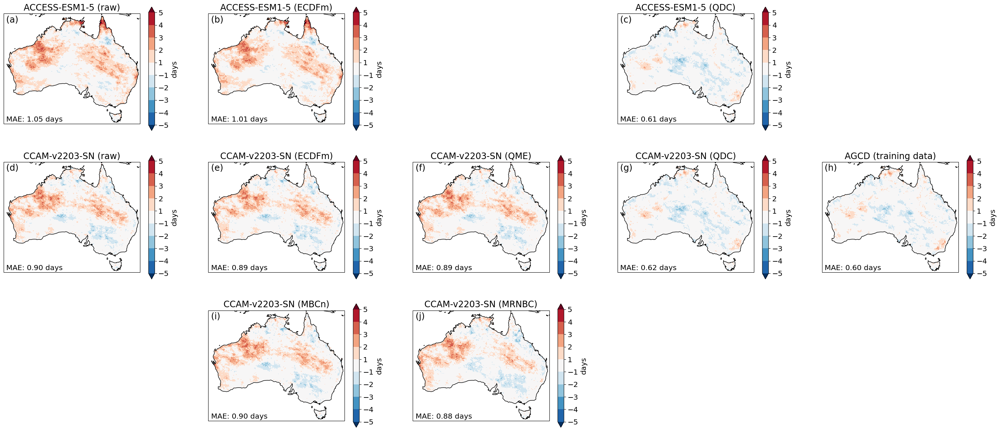

In [37]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_CSIRO-ACCESS-ESM1-5_UQ-DES-CCAM-2105.png


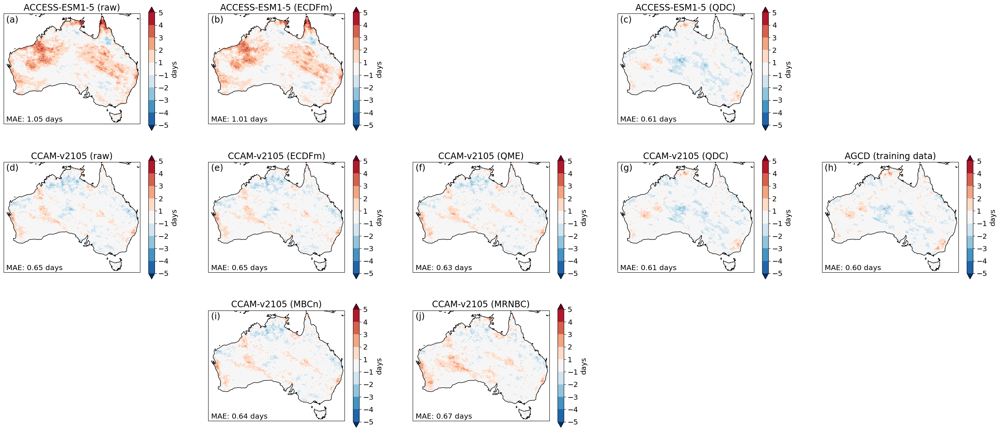

In [38]:
rcm = 'UQ-DES-CCAM-2105'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### CESM2

In [39]:
gcm = 'NCAR-CESM2'
task = 'xvalidation'
rcm = 'BOM-BARPA-R'

Annual mean 1990-2019 WSDI


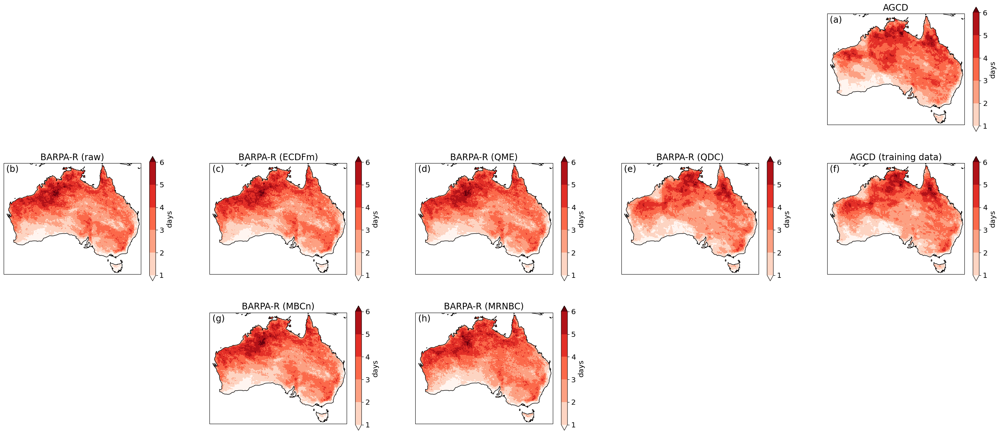

In [40]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values, outfile=False)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_NCAR-CESM2_BOM-BARPA-R.png


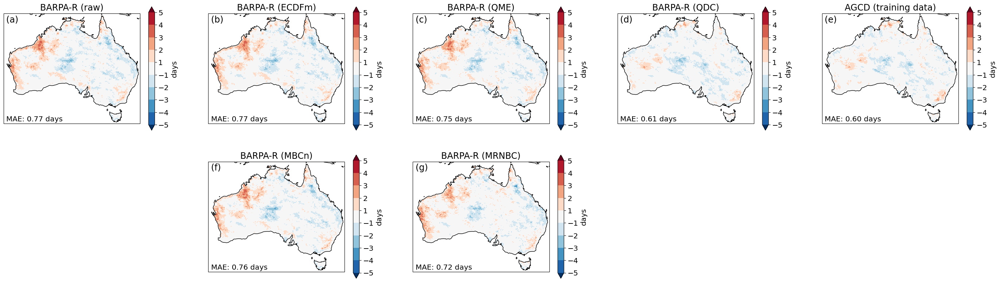

In [41]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_NCAR-CESM2_CSIRO-CCAM-2203.png


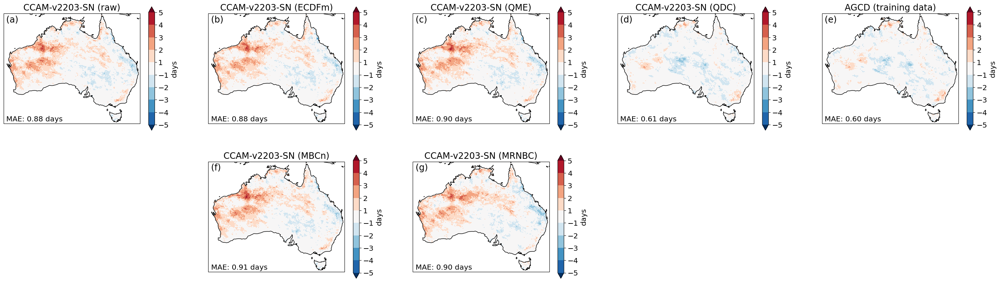

In [42]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

#### EC-Earth3

In [43]:
gcm = 'EC-Earth-Consortium-EC-Earth3'
task = 'xvalidation'
rcm = 'BOM-BARPA-R'

Annual mean 1990-2019 WSDI


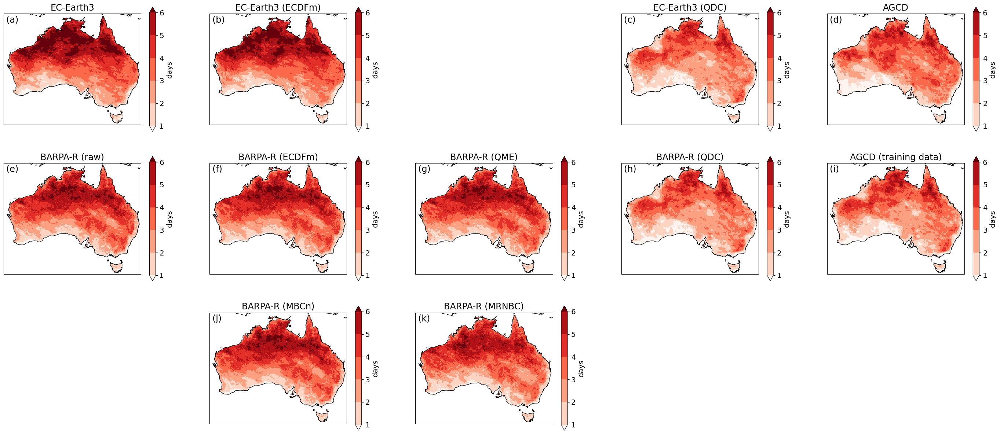

In [44]:
plot_values(gcm, rcm, task, index, cmap=cmap_values, levels=levels_values)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_EC-Earth-Consortium-EC-Earth3_BOM-BARPA-R.png


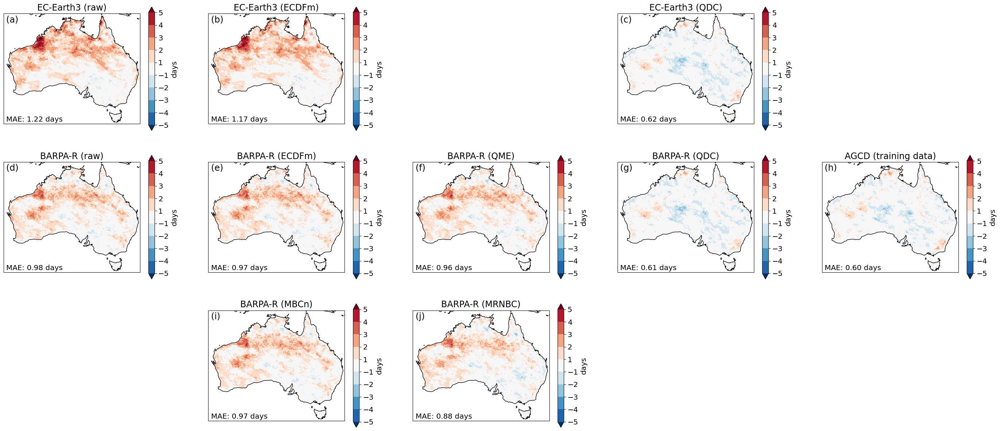

In [45]:
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

Bias (model minus obs) in the 1990-2019 WSDI
/g/data/ia39/npcp/code/results/figures/tasmax_WSDI-bias_task-xvalidation_EC-Earth-Consortium-EC-Earth3_CSIRO-CCAM-2203.png


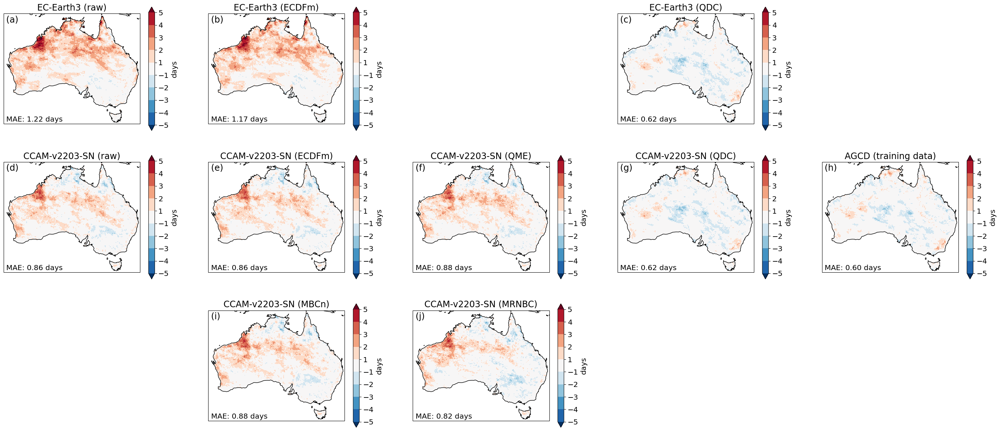

In [46]:
rcm = 'CSIRO-CCAM-2203'
mae_data[task][f'{gcm}_{rcm}'] = plot_comparison(
    gcm, rcm, task, index, cmap=cmap_bias, levels=levels_bias, outfile=True
)

In [47]:
with open(f'{outdir}wsdi.yaml', 'w') as outfile:
    yaml.dump(mae_data, outfile)